### Data Loading

In [394]:
import pandas as pd
import numpy as np
from datetime import datetime
import plotly.express as px

In [395]:
df_results = pd.read_csv('df_results_union.csv',sep=",",index_col=0)
df_results['NumOptiColoris'] = df_results['NumOptiColoris'].astype(str)
df_results['batch'] = df_results['NumOptiColoris'].str[8:12]
df_results['color'] = df_results['NumOptiColoris'].str[12:14]
df_results['arrangement'] = df_results['NumOptiColoris'].str[14:]
df_results["SurfaceResCre"] = df_results["SurfaceResCre"].str.replace(',', '.', regex=False)
df_results["SurfacePieCre"] = df_results["SurfacePieCre"].str.replace(',', '.', regex=False)
df_results["SurfacePanUtil"] = df_results["SurfacePanUtil"].str.replace(',', '.', regex=False)
df_results["SurfaceResCre"]=df_results["SurfaceResCre"].astype("float")
df_results["SurfacePieCre"]=df_results["SurfacePieCre"].astype("float")
df_results["SurfacePanUtil"]=df_results["SurfacePanUtil"].astype("float")
df_results["Waste"] = 1- ((df_results["SurfaceResCre"] + df_results["SurfacePieCre"]) / df_results["SurfacePanUtil"])
df_results.head()

,ID,NumOptiColoris,CodeArticleMatiere,NbPiecesObligatoiresDonnees,NbPiecesFacultativesDonnees,NbRestesDonnes,NbPleinFormatUtilise,NbPiecesFacultativesOptimisees,NbPiecesRestesUtilises,NbPiecesRestesCrees,NbPredebitDonnePourUtilisation,NbPredebitDonnePourCreation,NbPredebitUtilise,NbPredebitCree,NbTotalPiecesOptimisees,NiveauCoupe1,NiveauCoupe2,NiveauCoupe3,NiveauCoupe4,NbPiecesPrio1,NbPiecesPrio2,NbPiecesPrio3,SurfaceResCre,SurfacePieCre,SurfacePanUtil,SurfaceResUtil,DateModification,batch,color,arrangement,Waste
0,34721,20231204090101011,215791,4,2,1,2,1,1,0,0,0,0,0,5,0,5,0,0,1,0,0,0.000000,7.628552,12.789600,"2,7096","2023-12-04 05:45:18,373",0901,01,011,0.403535
1,34722,20231204090101012,215805,4,4,0,4,1,0,1,0,0,0,0,6,0,5,0,0,1,0,0,1.763520,9.160910,20.160000,0,"2023-12-04 05:45:34,327",0901,01,012,0.458114
2,34723,20231204953601001,167313,2,15,3,0,0,1,0,0,0,0,0,2,0,2,0,0,0,0,0,0.000000,0.963202,1.541988,"3,394503","2023-12-04 09:14:17,323",9536,01,001,0.375351
3,34724,20231204953601002,167605,2,0,3,2,0,0,2,0,0,0,0,4,0,2,0,0,0,0,0,6.013000,4.083627,10.578000,"3,096196","2023-12-04 09:14:33,423",9536,01,002,0.045507
4,34725,20231204953601003,167636,1,7,3,0,0,1,1,0,0,0,0,2,0,1,0,0,0,0,0,1.510076,0.642001,2.496900,"4,427484","2023-12-04 09:14:50,153",9536,01,003,0.138100


In [396]:
df_results.drop(inplace=True,columns=['ID','NbPleinFormatUtilise',
       'NbPiecesFacultativesOptimisees', 'NbPiecesRestesUtilises',
       'NbPiecesRestesCrees', 'NbPredebitDonnePourUtilisation',
       'NbPredebitDonnePourCreation', 'NbPredebitUtilise', 'NbPredebitCree',
       'NbTotalPiecesOptimisees', 'NiveauCoupe1', 'NiveauCoupe2',
       'NiveauCoupe3', 'NiveauCoupe4', 'NbPiecesPrio1', 'NbPiecesPrio2',
       'NbPiecesPrio3',"SurfaceResCre","SurfacePieCre","SurfacePanUtil","SurfaceResUtil",'color','arrangement'])

In [397]:
df_results["NumOptiColoris"]=df_results["NumOptiColoris"].astype("int64")

In [398]:
df_mats=pd.read_csv("df_mats_union.csv", sep=",",index_col=0)
df_mats.drop(inplace=True,columns=["IDNO","DesignationFRA","NombreReste","ColorisInt","ColorisExt","DimensionZ","SensFilInt","ChuteBroyable","GroupeMatiere","Inciseur","CoupeDePropreteX","CoupeDePropreteY","ResteInterdit","SansCoupeImbriquee","SansCoupeDeTete","EpaisseurChant1Fournisseur","EpaisseurChant2Fournisseur","EpaisseurChant3Fournisseur","EpaisseurChant4Fournisseur","FormeChant1Fournisseur","FormeChant2Fournisseur","FormeChant3Fournisseur","FormeChant4Fournisseur"])
df_mats.drop(inplace=True,columns=["DateCreation","Type","Reference","ResteDimXMini","ResteDimYMini"])

### Feature Engineering with ALL Dimensions

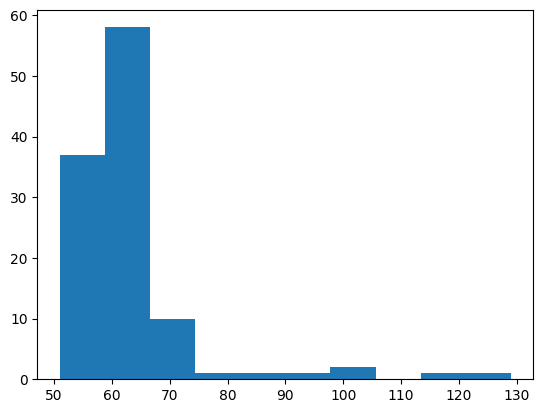

11


In [399]:
import matplotlib.pyplot as plt
agg_df = df_mats.groupby("NumOpti").agg({"DimensionX":"count"})

# Then, filter rows where count is greater than 65
filtered_df = agg_df[agg_df["DimensionX"] >50]

# Finally, plot the histogram
plt.hist(filtered_df["DimensionX"])
plt.show()
print((df_mats.groupby("NumOpti").agg({"DimensionX":"count"})["DimensionX"]>70).sum())

#keeping 70 because more important info , loosing 60 dimensions

In [400]:
n_new_columns = 65
df_unique = df_mats.drop(['DimensionX', 'DimensionY', "CodeArticleMatiere"], axis=1).drop_duplicates()

# Now we create a dictionary to hold the expanded data
expanded_data = {f'mat_DimX_{i+1}': [] for i in range(n_new_columns)}
expanded_data.update({f'mat_DimY_{i+1}': [] for i in range(n_new_columns)})
expanded_data['NumOpti'] = []

# Populate the dictionary with the data from each group
for name, group in df_mats.groupby('NumOpti'):
    # Add the 'NumOpti' value
    expanded_data['NumOpti'].append(name)

    # Add the actual values for each piece
    for i in range(n_new_columns):
        if i < len(group):
            expanded_data[f'mat_DimX_{i+1}'].append(group['DimensionX'].iloc[i])
            expanded_data[f'mat_DimY_{i+1}'].append(group['DimensionY'].iloc[i])
        else:
            # Fill the rest with zeros
            expanded_data[f'mat_DimX_{i+1}'].append(0)
            expanded_data[f'mat_DimY_{i+1}'].append(0)

# Create a dataframe from the dictionary
df_mats_expanded = pd.DataFrame(expanded_data)

# Merge the expanded dataframe with the unique dataframe
df_mats_final = pd.merge(df_unique, df_mats_expanded, on='NumOpti')

# Display the final dataframe structure
df_mats_final.head()

,NumOpti,SensFilExt,mat_DimX_1,mat_DimX_2,mat_DimX_3,mat_DimX_4,mat_DimX_5,mat_DimX_6,mat_DimX_7,mat_DimX_8,mat_DimX_9,mat_DimX_10,mat_DimX_11,mat_DimX_12,mat_DimX_13,mat_DimX_14,mat_DimX_15,mat_DimX_16,mat_DimX_17,mat_DimX_18,mat_DimX_19,mat_DimX_20,mat_DimX_21,mat_DimX_22,mat_DimX_23,mat_DimX_24,mat_DimX_25,mat_DimX_26,mat_DimX_27,mat_DimX_28,mat_DimX_29,mat_DimX_30,mat_DimX_31,mat_DimX_32,mat_DimX_33,mat_DimX_34,mat_DimX_35,mat_DimX_36,mat_DimX_37,mat_DimX_38,mat_DimX_39,mat_DimX_40,mat_DimX_41,mat_DimX_42,mat_DimX_43,mat_DimX_44,mat_DimX_45,mat_DimX_46,mat_DimX_47,mat_DimX_48,mat_DimX_49,mat_DimX_50,mat_DimX_51,mat_DimX_52,mat_DimX_53,mat_DimX_54,mat_DimX_55,mat_DimX_56,mat_DimX_57,mat_DimX_58,mat_DimX_59,mat_DimX_60,mat_DimX_61,mat_DimX_62,mat_DimX_63,mat_DimX_64,mat_DimX_65,mat_DimY_1,mat_DimY_2,mat_DimY_3,mat_DimY_4,mat_DimY_5,mat_DimY_6,mat_DimY_7,mat_DimY_8,mat_DimY_9,mat_DimY_10,mat_DimY_11,mat_DimY_12,mat_DimY_13,mat_DimY_14,mat_DimY_15,mat_DimY_16,mat_DimY_17,mat_DimY_18,mat_DimY_19,mat_DimY_20,mat_DimY_21,mat_DimY_22,mat_DimY_23,mat_DimY_24,mat_DimY_25,mat_DimY_26,mat_DimY_27,mat_DimY_28,mat_DimY_29,mat_DimY_30,mat_DimY_31,mat_DimY_32,mat_DimY_33,mat_DimY_34,mat_DimY_35,mat_DimY_36,mat_DimY_37,mat_DimY_38,mat_DimY_39,mat_DimY_40,mat_DimY_41,mat_DimY_42,mat_DimY_43,mat_DimY_44,mat_DimY_45,mat_DimY_46,mat_DimY_47,mat_DimY_48,mat_DimY_49,mat_DimY_50,mat_DimY_51,mat_DimY_52,mat_DimY_53,mat_DimY_54,mat_DimY_55,mat_DimY_56,mat_DimY_57,mat_DimY_58,mat_DimY_59,mat_DimY_60,mat_DimY_61,mat_DimY_62,mat_DimY_63,mat_DimY_64,mat_DimY_65
0,20231130080101006,X,41000,23540,41000,41000,41000,41000,41000,41000,41000,41000,41000,20160,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6090,6090,6090,12900,6090,6090,6140,6090,6090,6090,6090,6260,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,20231130080101007,0,42000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6750,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,20231130080101008,X,41000,16060,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12000,6750,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,20231130080101009,X,41000,41000,41000,41000,41000,41000,41000,23950,41000,41000,41000,41000,15120,41000,23820,41000,19260,19010,20050,18420,24630,26420,41000,41000,27260,23510,24790,32940,19010,41000,16060,22010,19810,28160,24010,30110,16000,15050,41000,28330,17560,19710,16510,20740,19010,41000,41000,13990,41000,19710,15210,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12900,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6150,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6140,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6040,6090,6090,6090,6090,6760,6090,6090,6090,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,20231201020101003,X,41000,41000,28010,26010,20910,41000,23450,41000,41000,41000,21810,21640,19910,20160,26010,16510,16010,18410,17280,41000,26580,18210,41000,20410,41000,18630,41000,19510,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6140,6090,6090,6090,6090,12900,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6090,6100,6090,6090,6090,6090,6100,6090,6090,6090,6090,6090,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [401]:
df_pieces=pd.read_csv("df_pieces_union.csv", sep=",",index_col=0)

In [402]:
df_pieces.drop(inplace=True,columns=["IDNO","DateCreation","DesignationFRA","ColorisInt","ColorisExt",'DimZCpsPDC', 'RetournerBande', 'SensFilIntCps','FacultatifPriorite', 'Urgent',
       'RecoupePost', 'DesignationPF', 'Epaisseurchant1',"Facultatif",
       'ArticleMatgeneriqueChant1', 'PgUsinageChant1', 'Epaisseurchant2',
       'ArticleMatgeneriqueChant2', 'PgUsinageChant2', 'Epaisseurchant3',
       'ArticleMatgeneriqueChant3', 'PgUsinageChant3', 'Epaisseurchant4',
       'ArticleMatgeneriqueChant4', 'PgUsinageChant4', 'MatiereRemplacement',
       'OrientationCps',"Codebarre"])

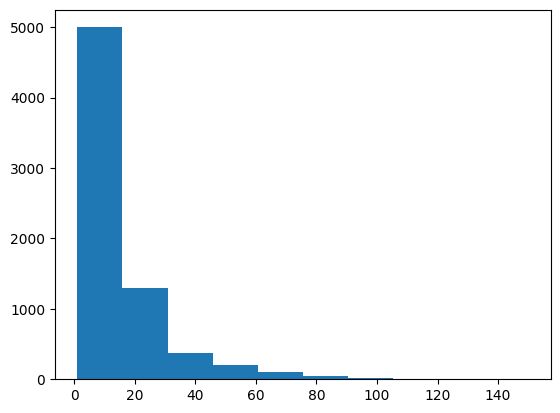

7045


In [403]:
agg_df = df_pieces.groupby("NumOpti").agg({"DimXCpsPDC": "count"})

# Then, filter rows where count is greater than 100 (adjusting to your condition)
filtered_df = agg_df[agg_df["DimXCpsPDC"] > 0]

# Finally, plot the histogram
plt.hist(filtered_df["DimXCpsPDC"])
plt.show()

# Print the number of groups where DimXCpsPDC count is greater than 100
print(filtered_df.shape[0])

#loosing the last 5 optimizations => not relevant

In [404]:
n_new_columns = 75
df_unique = df_pieces.drop(['DimXCpsPDC', 'DimYCpsPDC', "CodeArticleMatiere"], axis=1).drop_duplicates()

# Now we create a dictionary to hold the expanded data
expanded_data = {f'pie_dimX_{i+1}': [] for i in range(n_new_columns)}
expanded_data.update({f'pie_dimY_{i+1}': [] for i in range(n_new_columns)})
expanded_data['NumOpti'] = []

# Populate the dictionary with the data from each group
for name, group in df_pieces.groupby('NumOpti'):
    # Add the 'NumOpti' value
    expanded_data['NumOpti'].append(name)

    # Add the actual values for each piece
    for i in range(n_new_columns):
        if i < len(group):
            expanded_data[f'pie_dimX_{i+1}'].append(group['DimXCpsPDC'].iloc[i])
            expanded_data[f'pie_dimY_{i+1}'].append(group['DimYCpsPDC'].iloc[i])
        else:
            # Fill the rest with zeros
            expanded_data[f'pie_dimX_{i+1}'].append(0)
            expanded_data[f'pie_dimY_{i+1}'].append(0)

# Create a dataframe from the dictionary
df_expanded = pd.DataFrame(expanded_data)

# Merge the expanded dataframe with the unique dataframe
df_pieces_final = pd.merge(df_unique, df_expanded, on='NumOpti')

# Display the final dataframe structure
df_pieces_final.head()

,NumOpti,SensFilExtCps,pie_dimX_1,pie_dimX_2,pie_dimX_3,pie_dimX_4,pie_dimX_5,pie_dimX_6,pie_dimX_7,pie_dimX_8,pie_dimX_9,pie_dimX_10,pie_dimX_11,pie_dimX_12,pie_dimX_13,pie_dimX_14,pie_dimX_15,pie_dimX_16,pie_dimX_17,pie_dimX_18,pie_dimX_19,pie_dimX_20,pie_dimX_21,pie_dimX_22,pie_dimX_23,pie_dimX_24,pie_dimX_25,pie_dimX_26,pie_dimX_27,pie_dimX_28,pie_dimX_29,pie_dimX_30,pie_dimX_31,pie_dimX_32,pie_dimX_33,pie_dimX_34,pie_dimX_35,pie_dimX_36,pie_dimX_37,pie_dimX_38,pie_dimX_39,pie_dimX_40,pie_dimX_41,pie_dimX_42,pie_dimX_43,pie_dimX_44,pie_dimX_45,pie_dimX_46,pie_dimX_47,pie_dimX_48,pie_dimX_49,pie_dimX_50,pie_dimX_51,pie_dimX_52,pie_dimX_53,pie_dimX_54,pie_dimX_55,pie_dimX_56,pie_dimX_57,pie_dimX_58,pie_dimX_59,pie_dimX_60,pie_dimX_61,pie_dimX_62,pie_dimX_63,pie_dimX_64,pie_dimX_65,pie_dimX_66,pie_dimX_67,pie_dimX_68,pie_dimX_69,pie_dimX_70,pie_dimX_71,pie_dimX_72,pie_dimX_73,pie_dimX_74,pie_dimX_75,pie_dimY_1,pie_dimY_2,pie_dimY_3,pie_dimY_4,pie_dimY_5,pie_dimY_6,pie_dimY_7,pie_dimY_8,pie_dimY_9,pie_dimY_10,pie_dimY_11,pie_dimY_12,pie_dimY_13,pie_dimY_14,pie_dimY_15,pie_dimY_16,pie_dimY_17,pie_dimY_18,pie_dimY_19,pie_dimY_20,pie_dimY_21,pie_dimY_22,pie_dimY_23,pie_dimY_24,pie_dimY_25,pie_dimY_26,pie_dimY_27,pie_dimY_28,pie_dimY_29,pie_dimY_30,pie_dimY_31,pie_dimY_32,pie_dimY_33,pie_dimY_34,pie_dimY_35,pie_dimY_36,pie_dimY_37,pie_dimY_38,pie_dimY_39,pie_dimY_40,pie_dimY_41,pie_dimY_42,pie_dimY_43,pie_dimY_44,pie_dimY_45,pie_dimY_46,pie_dimY_47,pie_dimY_48,pie_dimY_49,pie_dimY_50,pie_dimY_51,pie_dimY_52,pie_dimY_53,pie_dimY_54,pie_dimY_55,pie_dimY_56,pie_dimY_57,pie_dimY_58,pie_dimY_59,pie_dimY_60,pie_dimY_61,pie_dimY_62,pie_dimY_63,pie_dimY_64,pie_dimY_65,pie_dimY_66,pie_dimY_67,pie_dimY_68,pie_dimY_69,pie_dimY_70,pie_dimY_71,pie_dimY_72,pie_dimY_73,pie_dimY_74,pie_dimY_75
0,20231212955601006,X,15310,20510,29310,29840,27510,12410,27110,13140,28390,11750,23710,9980,8740,27610,19010,31260,6260,27810,14010,27510,15010,40020,18010,8010,10760,16310,15510,24210,20010,18630,18010,17510,25930,20720,12010,16710,16010,12310,28510,15510,13260,22600,21010,21510,24210,13010,33510,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6260,10510,6260,9410,4010,9010,10260,4960,6260,9520,9860,4040,8440,6260,9010,12410,6260,6260,8010,6260,7460,6760,6760,6760,7600,7410,8930,9010,6760,6260,6760,10510,6760,6260,8010,4010,11860,4510,6260,4510,4510,4850,6260,9010,7260,9010,6260,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,20231212955601006,Y,15310,20510,29310,29840,27510,12410,27110,13140,28390,11750,23710,9980,8740,27610,19010,31260,6260,27810,14010,27510,15010,40020,18010,8010,10760,16310,15510,24210,20010,18630,18010,17510,25930,20720,12010,16710,16010,12310,28510,15510,13260,22600,21010,21510,24210,13010,33510,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6260,10510,6260,9410,4010,9010,10260,4960,6260,9520,9860,4040,8440,6260,9010,12410,6260,6260,8010,6260,7460,6760,6760,6760,7600,7410,8930,9010,6760,6260,6760,10510,6760,6260,8010,4010,11860,4510,6260,4510,4510,4850,6260,9010,7260,9010,6260,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,20231212955601007,X,18010,18660,4110,17510,27410,13010,8840,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6460,6210,4710,6260,6260,3610,12440,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,20231212955601007,Y,18010,18660,4110,17510,27410,13010,8840,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6460,6210,4710,6260,6260,3610,12440,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,20231212955601008,,13140,22010,30060,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

### Aggregated Features Like Area Perimeter AspectRatio Mean Median Max Min

In [405]:
df_mats_new=pd.read_csv("df_mats_union.csv", sep=",",index_col=0)
df_mats_new.drop(inplace=True,columns=["IDNO","DesignationFRA","NombreReste","ColorisInt","ColorisExt","DimensionZ","SensFilInt","ChuteBroyable","GroupeMatiere","Inciseur","CoupeDePropreteX","CoupeDePropreteY","ResteInterdit","SansCoupeImbriquee","SansCoupeDeTete","EpaisseurChant1Fournisseur","EpaisseurChant2Fournisseur","EpaisseurChant3Fournisseur","EpaisseurChant4Fournisseur","FormeChant1Fournisseur","FormeChant2Fournisseur","FormeChant3Fournisseur","FormeChant4Fournisseur"])
df_mats_new.drop(inplace=True,columns=["DateCreation","Type","Reference","ResteDimXMini","ResteDimYMini"])
# Defining new aggregation functions for materials
aggregations = {
    'DimensionX': [ 'min', 'max',"median"],
    'DimensionY': [ 'min', 'max',"median"],
    'SensFilExt': lambda x: x.mode()[0] if not x.mode().empty else None
}

# Perform the grouping
grouped_mats = df_mats_new.groupby('NumOpti').agg(aggregations)

# Calculate 'Area', 'AspectRatio', and 'Perimeter' for the DataFrame before grouping
grouped_mats['Area_median'] = (grouped_mats['DimensionX']['median'] * grouped_mats['DimensionY']['median'])
grouped_mats['Area_min'] = (grouped_mats['DimensionX']['min'] * grouped_mats['DimensionY']['min'])
grouped_mats['Area_max'] = (grouped_mats['DimensionX']['max'] * grouped_mats['DimensionY']['max'])

grouped_mats['AspectRatio_median'] = (grouped_mats['DimensionY']['median'] / grouped_mats['DimensionX']['median'])
grouped_mats['AspectRatio_min'] = (grouped_mats['DimensionY']['min'] / grouped_mats['DimensionX']['min'])
grouped_mats['AspectRatio_max'] = (grouped_mats['DimensionY']['max'] / grouped_mats['DimensionX']['max'])

grouped_mats['Perimeter_median'] = 2 * (grouped_mats['DimensionX']['median'] + grouped_mats['DimensionY']['median'])
grouped_mats['Perimeter_min'] = 2 * (grouped_mats['DimensionX']['min'] + grouped_mats['DimensionY']['min'])
grouped_mats['Perimeter_max'] = 2 * (grouped_mats['DimensionX']['max'] + grouped_mats['DimensionY']['max'])

# Flatten the MultiIndex created by groupby.agg()
grouped_mats.columns = ['_'.join(col).strip() for col in grouped_mats.columns.values]

# Reset index to flatten the DataFrame
grouped_mats.reset_index(inplace=True)

grouped_mats.rename(columns={'SensFilExt_<lambda>': 'SensFilExt_mode'}, inplace=True)


In [406]:
df_pieces_new=pd.read_csv("df_pieces_union.csv", sep=",",index_col=0)
df_pieces_new.drop(inplace=True,columns=["IDNO","DateCreation","DesignationFRA","ColorisInt","ColorisExt",'DimZCpsPDC', 'RetournerBande', 'SensFilIntCps','FacultatifPriorite', 'Urgent',
       'RecoupePost', 'DesignationPF', 'Epaisseurchant1',"Facultatif",
       'ArticleMatgeneriqueChant1', 'PgUsinageChant1', 'Epaisseurchant2',
       'ArticleMatgeneriqueChant2', 'PgUsinageChant2', 'Epaisseurchant3',
       'ArticleMatgeneriqueChant3', 'PgUsinageChant3', 'Epaisseurchant4',
       'ArticleMatgeneriqueChant4', 'PgUsinageChant4', 'MatiereRemplacement',
       'OrientationCps',"Codebarre"])
# Defining new aggregation functions for pieces
aggregations = {
    'DimXCpsPDC': [ 'min', 'max',"median"],
    'DimYCpsPDC': [ 'min', 'max',"median"],
    'SensFilExtCps': lambda x: x.mode()[0] if not x.mode().empty else None
}

# Calculate 'Area', 'AspectRatio', and 'Perimeter' for the DataFrame before grouping
df_pieces_new['AreaCpsPDC'] = df_pieces_new['DimXCpsPDC'] * df_pieces_new['DimYCpsPDC']
df_pieces_new['AspectRatioCpsPDC'] = df_pieces_new['DimYCpsPDC'] / df_pieces_new['DimXCpsPDC']
df_pieces_new['PerimeterCpsPDC'] = 2 * (df_pieces_new['DimXCpsPDC'] + df_pieces_new['DimYCpsPDC'])

# Perform the grouping
grouped_pieces = df_pieces_new.groupby('NumOpti').agg(aggregations)

# Calculate aggregate values for area, aspect ratio, and perimeter after the groupby
grouped_pieces['AreaCpsPDC_median'] = grouped_pieces['DimXCpsPDC']['median'] * grouped_pieces['DimYCpsPDC']['median']
grouped_pieces['AreaCpsPDC_min'] = grouped_pieces['DimXCpsPDC']['min'] * grouped_pieces['DimYCpsPDC']['min']
grouped_pieces['AreaCpsPDC_max'] = grouped_pieces['DimXCpsPDC']['max'] * grouped_pieces['DimYCpsPDC']['max']

grouped_pieces['AspectRatioCpsPDC_median'] = grouped_pieces['DimYCpsPDC']['median'] / grouped_pieces['DimXCpsPDC']['median']
grouped_pieces['AspectRatioCpsPDC_min'] = grouped_pieces['DimYCpsPDC']['min'] / grouped_pieces['DimXCpsPDC']['min']
grouped_pieces['AspectRatioCpsPDC_max'] = grouped_pieces['DimYCpsPDC']['max'] / grouped_pieces['DimXCpsPDC']['max']

grouped_pieces['PerimeterCpsPDC_median'] = 2 * (grouped_pieces['DimXCpsPDC']['median'] + grouped_pieces['DimYCpsPDC']['median'])
grouped_pieces['PerimeterCpsPDC_min'] = 2 * (grouped_pieces['DimXCpsPDC']['min'] + grouped_pieces['DimYCpsPDC']['min'])
grouped_pieces['PerimeterCpsPDC_max'] = 2 * (grouped_pieces['DimXCpsPDC']['max'] + grouped_pieces['DimYCpsPDC']['max'])

# Flatten the MultiIndex created by groupby.agg()
grouped_pieces.columns = ['_'.join(col).strip() for col in grouped_pieces.columns.values]

# Reset index to flatten the DataFrame
grouped_pieces.reset_index(inplace=True)

# Rename the columns where the lambda function was used to calculate mode
grouped_pieces.rename(columns={'SensFilExtCps_<lambda>': 'SensFilExtCps_mode'}, inplace=True)


### Merging Pieces and Materials with Results

In [407]:
df_results_sparse=pd.merge(df_results, df_pieces_final, left_on='NumOptiColoris', right_on='NumOpti', how='left')

In [408]:
df_results_sparse = pd.merge(df_results_sparse, df_mats_final, left_on='NumOptiColoris', right_on='NumOpti', how='left')

In [409]:
df_results_sparse=df_results_sparse.drop(columns=['NumOpti_x','NumOpti_y'])
df_results_sparse = df_results_sparse.rename(columns={
    'SensFilExtCps': 'pieces_SensFilExtCps',
    'SensFilExt': 'mats_SensFilExt'
})

In [410]:
# Rename columns in 'grouped_pieces' DataFrame only
grouped_pieces_renamed = grouped_pieces.rename(columns=lambda x: f'pieces_{x}' if x != 'NumOpti' else x)

# Merge without adding suffixes automatically
df_results_sparse = pd.merge(df_results_sparse, grouped_pieces_renamed, left_on='NumOptiColoris', right_on='NumOpti', how='left')

# Rename columns in 'grouped_pieces' DataFrame only
grouped_mats_renamed = grouped_mats.rename(columns=lambda x: f'mats_{x}' if x != 'NumOpti' else x)

# Merge without adding suffixes automatically
df_results_sparse = pd.merge(df_results_sparse, grouped_mats_renamed, left_on='NumOptiColoris', right_on='NumOpti', how='left')

In [411]:
df_results_sparse=df_results_sparse.drop(columns=['NumOpti_x','NumOpti_y','pieces_SensFilExtCps_mode', 'mats_SensFilExt_mode'])


### More Features

In [412]:
from sklearn.preprocessing import PolynomialFeatures

# For demonstration, we select a subset of features
# Normally, you'd select based on correlations or domain knowledge
features_subset = df_results_sparse[['NbPiecesObligatoiresDonnees', 'NbPiecesFacultativesDonnees',"pieces_AreaCpsPDC_median_","mats_Area_median_"]]

# Initialize the PolynomialFeatures object
poly = PolynomialFeatures(degree=2, include_bias=False)  # Degree 2 for quadratic terms

# Fit and transform the subset of features to create polynomial features
poly_features = poly.fit_transform(features_subset)

# Convert the generated polynomial features into a DataFrame
poly_features_df = pd.DataFrame(poly_features, columns=poly.get_feature_names_out(features_subset.columns))

# Display the first few rows of the generated polynomial features
poly_features_df.head()
df_results_sparse = df_results_sparse.reset_index(drop=True)

# Concatenate the original dataset with the polynomial features dataframe
df_results_sparse = pd.concat([df_results_sparse, poly_features_df], axis=1)

df_results_sparse.head()

,NumOptiColoris,CodeArticleMatiere,NbPiecesObligatoiresDonnees,NbPiecesFacultativesDonnees,NbRestesDonnes,DateModification,batch,Waste,pieces_SensFilExtCps,pie_dimX_1,pie_dimX_2,pie_dimX_3,pie_dimX_4,pie_dimX_5,pie_dimX_6,pie_dimX_7,pie_dimX_8,pie_dimX_9,pie_dimX_10,pie_dimX_11,pie_dimX_12,pie_dimX_13,pie_dimX_14,pie_dimX_15,pie_dimX_16,pie_dimX_17,pie_dimX_18,pie_dimX_19,pie_dimX_20,pie_dimX_21,pie_dimX_22,pie_dimX_23,pie_dimX_24,pie_dimX_25,pie_dimX_26,pie_dimX_27,pie_dimX_28,pie_dimX_29,pie_dimX_30,pie_dimX_31,pie_dimX_32,pie_dimX_33,pie_dimX_34,pie_dimX_35,pie_dimX_36,pie_dimX_37,pie_dimX_38,pie_dimX_39,pie_dimX_40,pie_dimX_41,pie_dimX_42,pie_dimX_43,pie_dimX_44,pie_dimX_45,pie_dimX_46,pie_dimX_47,pie_dimX_48,pie_dimX_49,pie_dimX_50,pie_dimX_51,pie_dimX_52,pie_dimX_53,pie_dimX_54,pie_dimX_55,pie_dimX_56,pie_dimX_57,pie_dimX_58,pie_dimX_59,pie_dimX_60,pie_dimX_61,pie_dimX_62,pie_dimX_63,pie_dimX_64,pie_dimX_65,pie_dimX_66,pie_dimX_67,pie_dimX_68,pie_dimX_69,pie_dimX_70,pie_dimX_71,pie_dimX_72,pie_dimX_73,pie_dimX_74,pie_dimX_75,pie_dimY_1,pie_dimY_2,pie_dimY_3,pie_dimY_4,pie_dimY_5,pie_dimY_6,pie_dimY_7,pie_dimY_8,pie_dimY_9,pie_dimY_10,pie_dimY_11,pie_dimY_12,pie_dimY_13,pie_dimY_14,pie_dimY_15,pie_dimY_16,pie_dimY_17,pie_dimY_18,pie_dimY_19,pie_dimY_20,pie_dimY_21,pie_dimY_22,pie_dimY_23,pie_dimY_24,pie_dimY_25,pie_dimY_26,pie_dimY_27,pie_dimY_28,pie_dimY_29,pie_dimY_30,pie_dimY_31,pie_dimY_32,pie_dimY_33,pie_dimY_34,pie_dimY_35,pie_dimY_36,pie_dimY_37,pie_dimY_38,pie_dimY_39,pie_dimY_40,pie_dimY_41,pie_dimY_42,pie_dimY_43,pie_dimY_44,pie_dimY_45,pie_dimY_46,pie_dimY_47,pie_dimY_48,pie_dimY_49,pie_dimY_50,pie_dimY_51,pie_dimY_52,pie_dimY_53,pie_dimY_54,pie_dimY_55,pie_dimY_56,pie_dimY_57,pie_dimY_58,pie_dimY_59,pie_dimY_60,pie_dimY_61,pie_dimY_62,pie_dimY_63,pie_dimY_64,pie_dimY_65,pie_dimY_66,pie_dimY_67,pie_dimY_68,pie_dimY_69,pie_dimY_70,pie_dimY_71,pie_dimY_72,pie_dimY_73,pie_dimY_74,pie_dimY_75,mats_SensFilExt,mat_DimX_1,mat_DimX_2,mat_DimX_3,mat_DimX_4,mat_DimX_5,mat_DimX_6,mat_DimX_7,mat_DimX_8,mat_DimX_9,mat_DimX_10,mat_DimX_11,mat_DimX_12,mat_DimX_13,mat_DimX_14,mat_DimX_15,mat_DimX_16,mat_DimX_17,mat_DimX_18,mat_DimX_19,mat_DimX_20,mat_DimX_21,mat_DimX_22,mat_DimX_23,mat_DimX_24,mat_DimX_25,mat_DimX_26,mat_DimX_27,mat_DimX_28,mat_DimX_29,mat_DimX_30,mat_DimX_31,mat_DimX_32,mat_DimX_33,mat_DimX_34,mat_DimX_35,mat_DimX_36,mat_DimX_37,mat_DimX_38,mat_DimX_39,mat_DimX_40,mat_DimX_41,mat_DimX_42,mat_DimX_43,mat_DimX_44,mat_DimX_45,mat_DimX_46,mat_DimX_47,mat_DimX_48,mat_DimX_49,mat_DimX_50,mat_DimX_51,mat_DimX_52,mat_DimX_53,mat_DimX_54,mat_DimX_55,mat_DimX_56,mat_DimX_57,mat_DimX_58,mat_DimX_59,mat_DimX_60,mat_DimX_61,mat_DimX_62,mat_DimX_63,mat_DimX_64,mat_DimX_65,mat_DimY_1,mat_DimY_2,mat_DimY_3,mat_DimY_4,mat_DimY_5,mat_DimY_6,mat_DimY_7,mat_DimY_8,mat_DimY_9,mat_DimY_10,mat_DimY_11,mat_DimY_12,mat_DimY_13,mat_DimY_14,mat_DimY_15,mat_DimY_16,mat_DimY_17,mat_DimY_18,mat_DimY_19,mat_DimY_20,mat_DimY_21,mat_DimY_22,mat_DimY_23,mat_DimY_24,mat_DimY_25,mat_DimY_26,mat_DimY_27,mat_DimY_28,mat_DimY_29,mat_DimY_30,mat_DimY_31,mat_DimY_32,mat_DimY_33,mat_DimY_34,mat_DimY_35,mat_DimY_36,mat_DimY_37,mat_DimY_38,mat_DimY_39,mat_DimY_40,mat_DimY_41,mat_DimY_42,mat_DimY_43,mat_DimY_44,mat_DimY_45,mat_DimY_46,mat_DimY_47,mat_DimY_48,mat_DimY_49,mat_DimY_50,mat_DimY_51,mat_DimY_52,mat_DimY_53,mat_DimY_54,mat_DimY_55,mat_DimY_56,mat_DimY_57,mat_DimY_58,mat_DimY_59,mat_DimY_60,mat_DimY_61,mat_DimY_62,mat_DimY_63,mat_DimY_64,mat_DimY_65,pieces_DimXCpsPDC_min,pieces_DimXCpsPDC_max,pieces_DimXCpsPDC_median,pieces_DimYCpsPDC_min,pieces_DimYCpsPDC_max,pieces_DimYCpsPDC_median,pieces_AreaCpsPDC_median_,pieces_AreaCpsPDC_min_,pieces_AreaCpsPDC_max_,pieces_AspectRatioCpsPDC_median_,pieces_AspectRatioCpsPDC_min_,pieces_AspectRatioCpsPDC_max_,pieces_PerimeterCpsPDC_median_,pieces_PerimeterCpsPDC_min_,pieces_PerimeterCpsPDC_max_,mats_DimensionX_min,mats_DimensionX_max,mats_DimensionX_median,mats_DimensionY_min,mats_DimensionY_max,mats_Dimens

### Adding Bins

In [413]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create a figure with subplots
fig = make_subplots(rows=2, cols=2)

# Histogram for df_pieces["DimXCpsPDC"]
fig.add_trace(go.Histogram(x=df_pieces["DimXCpsPDC"], nbinsx=20, name='Pieces_DimensionX'), row=1, col=1)

# Histogram for df_pieces["DimYCpsPDC"]
fig.add_trace(go.Histogram(x=df_pieces["DimYCpsPDC"], nbinsx=20, name='Pieces_DimensionY'), row=1, col=2)

# Histogram for df_mats["DimY"]
fig.add_trace(go.Histogram(x=df_mats["DimensionY"], nbinsx=20, name='Mats_DimY'), row=2, col=1)

# Histogram for df_mats["DimX"]
fig.add_trace(go.Histogram(x=df_mats["DimensionX"], nbinsx=20, name='Mats_DimX'), row=2, col=2)

# Update layout if necessary
fig.update_layout(title_text='Histograms of Dimensions', bargap=0.2)

# Show the figure
fig.show()


In [414]:
df_pieces = df_pieces[df_pieces['DimXCpsPDC'] <= 75000]


In [415]:
from scipy.stats import mode
df_mats_bin=df_mats.drop(columns="SensFilExt")

# Define bins for X and Y dimensions
mats_bins_x = np.linspace(df_mats_bin['DimensionX'].min(), df_mats_bin['DimensionX'].max(), 6)  # 5 bins for X
mats_bins_y = np.linspace(df_mats_bin['DimensionY'].min(), df_mats_bin['DimensionY'].max(),6)  # 5 bins for Y

# Digitize the X and Y dimensions into bins
df_mats_bin['DimensionX_bin_mats'] = pd.cut(df_mats_bin['DimensionX'], bins=bins_x, labels=False, right=False) 
df_mats_bin['DimensionY_bin_mats'] = pd.cut(df_mats_bin['DimensionY'], bins=bins_y, labels=False, right=False) 

# Create dummy variables for the bins and then sum them up within each NumOpti group
dummies_x = pd.get_dummies(df_mats_bin['DimensionX_bin_mats'], prefix='DimensionX_bin_mats')
dummies_y = pd.get_dummies(df_mats_bin['DimensionY_bin_mats'], prefix='DimensionY_bin_mats')
df_mats_expanded = pd.concat([df_mats_bin, dummies_x, dummies_y], axis=1)

# Group by NumOpti and sum the dummy variables to get the count in each bin
binned_counts_mats = df_mats_expanded.groupby('NumOpti')[dummies_x.columns.tolist() + dummies_y.columns.tolist()].sum()

# Rename the mode column for clarity
binned_counts_mats.reset_index(inplace=True)
# The grouped_mats DataFrame now contains 5 bins for X, 5 bins for Y, and the mode of SensFilExt for each NumOpti
binned_counts_mats.columns



Index(['NumOpti', 'DimensionX_bin_mats_0.0', 'DimensionX_bin_mats_1.0',
       'DimensionX_bin_mats_2.0', 'DimensionX_bin_mats_3.0',
       'DimensionX_bin_mats_4.0', 'DimensionY_bin_mats_0.0',
       'DimensionY_bin_mats_1.0', 'DimensionY_bin_mats_2.0',
       'DimensionY_bin_mats_3.0', 'DimensionY_bin_mats_4.0'],
      dtype='object')

In [669]:
mats_bins_x,mats_bins_y

(array([13990., 19592., 25194., 30796., 36398., 42000.]),
 array([ 5990.,  7372.,  8754., 10136., 11518., 12900.]))

In [668]:
import plotly.graph_objects as go
# Create subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=("Bins for Dimension X", "Bins for Dimension Y"))

# Add traces for bins_x
for i in range(len(mats_bins_x) - 1):
    fig.add_trace(
        go.Bar(
            x=[(mats_bins_x[i] + mats_bins_x[i + 1]) / 2],
            y=[1],
            width=[mats_bins_x[i + 1] - mats_bins_x[i]],
            name=f'Bin {i}: {mats_bins_x[i]}-{mats_bins_x[i + 1]}',
            showlegend=False
        ),
        row=1, col=1
    )

# Add traces for bins_y
for i in range(len(mats_bins_y) - 1):
    fig.add_trace(
        go.Bar(
            x=[(mats_bins_y[i] + mats_bins_y[i + 1]) / 2],
            y=[1],
            width=[mats_bins_y[i + 1] - mats_bins_y[i]],
            name=f'Bin {i}: {mats_bins_y[i]}-{mats_bins_y[i + 1]}',
            showlegend=False
        ),
        row=2, col=1
    )

# Update xaxis properties
fig.update_xaxes(title_text="Value Range", row=1, col=1)
fig.update_xaxes(title_text="Value Range", row=2, col=1)

# Update yaxis properties
fig.update_yaxes(title_text="Bin", row=1, col=1)
fig.update_yaxes(title_text="Bin", row=2, col=1)

# Update layout
fig.update_layout(height=600, width=800, title_text="Materials Bins Visualization", barmode='overlay')

# Show plot
fig.show()


In [418]:
from scipy.stats import mode
df_pieces_bin=df_pieces.drop(columns="SensFilExtCps")

pieces_bins_x = np.linspace(df_pieces_bin['DimXCpsPDC'].min(), df_pieces_bin['DimXCpsPDC'].max(),6)  # Edges for 5 bins for X
pieces_bins_y = np.linspace(df_pieces_bin['DimYCpsPDC'].min(), df_pieces_bin['DimYCpsPDC'].max(), 6)  # Edges for 5 bins for Y

# Use pd.cut to digitize the X and Y dimensions into 5 bins
df_pieces_bin['DimensionX_bin_pieces'] = pd.cut(df_pieces_bin['DimXCpsPDC'], bins=bins_x, labels=False, right=False)
df_pieces_bin['DimensionY_bin_pieces'] = pd.cut(df_pieces_bin['DimYCpsPDC'], bins=bins_y, labels=False, right=False)

# Create dummy variables for the bins and then sum them up within each NumOpti group
dummies_x = pd.get_dummies(df_pieces_bin['DimensionX_bin_pieces'], prefix='DimensionX_bin_pieces')
dummies_y = pd.get_dummies(df_pieces_bin['DimensionY_bin_pieces'], prefix='DimensionY_bin_pieces')
df_pieces_expanded = pd.concat([df_pieces_bin, dummies_x, dummies_y], axis=1)

# Group by NumOpti and sum the dummy variables to get the count in each bin
binned_counts_pieces = df_pieces_expanded.groupby('NumOpti')[dummies_x.columns.tolist() + dummies_y.columns.tolist()].sum()

# Rename the mode column for clarity and reset index
binned_counts_pieces.reset_index(inplace=True)
binned_counts_pieces.columns


Index(['NumOpti', 'DimensionX_bin_pieces_0.0', 'DimensionX_bin_pieces_1.0',
       'DimensionX_bin_pieces_2.0', 'DimensionX_bin_pieces_3.0',
       'DimensionX_bin_pieces_4.0', 'DimensionY_bin_pieces_0.0',
       'DimensionY_bin_pieces_1.0', 'DimensionY_bin_pieces_2.0',
       'DimensionY_bin_pieces_3.0', 'DimensionY_bin_pieces_4.0'],
      dtype='object')

In [671]:
import plotly.graph_objects as go
# Create subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=("Bins for Dimension X", "Bins for Dimension Y"))

# Add traces for bins_x
for i in range(len(pieces_bins_x) - 1):
    fig.add_trace(
        go.Bar(
            x=[(pieces_bins_x[i] + pieces_bins_x[i + 1]) / 2],
            y=[1],
            width=[pieces_bins_x[i + 1] - pieces_bins_x[i]],
            name=f'Bin {i}: {pieces_bins_x[i]}-{pieces_bins_x[i + 1]}',
            showlegend=False
        ),
        row=1, col=1
    )

# Add traces for bins_y
for i in range(len(pieces_bins_y) - 1):
    fig.add_trace(
        go.Bar(
            x=[(pieces_bins_y[i] + pieces_bins_y[i + 1]) / 2],
            y=[1],
            width=[pieces_bins_y[i + 1] - pieces_bins_y[i]],
            name=f'Bin {i}: {pieces_bins_y[i]}-{pieces_bins_y[i + 1]}',
            showlegend=False
        ),
        row=2, col=1
    )

# Update xaxis properties
fig.update_xaxes(title_text="Value Range", row=1, col=1)
fig.update_xaxes(title_text="Value Range", row=2, col=1)

# Update yaxis properties
fig.update_yaxes(title_text="Bin", row=1, col=1)
fig.update_yaxes(title_text="Bin", row=2, col=1)

# Update layout
fig.update_layout(height=600, width=800, title_text="Pieces Bins Visualization", barmode='overlay')

# Show plot
fig.show()


In [672]:
pieces_bins_x,pieces_bins_y

(array([ 2510., 10046., 17582., 25118., 32654., 40190.]),
 array([ 1210.,  3490.,  5770.,  8050., 10330., 12610.]))

In [420]:
df_results_sparse=pd.merge(df_results_sparse, binned_counts_mats, left_on='NumOptiColoris',right_on="NumOpti", how='left')
df_results_sparse = pd.merge(df_results_sparse, binned_counts_pieces, left_on='NumOptiColoris',right_on="NumOpti", how='left')

### Small Adjustment on Features

In [422]:
display(df_results_sparse.columns,max)

Index(['NumOptiColoris', 'CodeArticleMatiere', 'NbPiecesObligatoiresDonnees',
       'NbPiecesFacultativesDonnees', 'NbRestesDonnes', 'DateModification',
       'batch', 'Waste', 'pieces_SensFilExtCps', 'pie_dimX_1',
       ...
       'DimensionX_bin_pieces_0.0', 'DimensionX_bin_pieces_1.0',
       'DimensionX_bin_pieces_2.0', 'DimensionX_bin_pieces_3.0',
       'DimensionX_bin_pieces_4.0', 'DimensionY_bin_pieces_0.0',
       'DimensionY_bin_pieces_1.0', 'DimensionY_bin_pieces_2.0',
       'DimensionY_bin_pieces_3.0', 'DimensionY_bin_pieces_4.0'],
      dtype='object', length=356)

<function max>

In [423]:
pd.set_option('display.max_columns', None)
display(df_results_sparse)


,NumOptiColoris,CodeArticleMatiere,NbPiecesObligatoiresDonnees,NbPiecesFacultativesDonnees,NbRestesDonnes,DateModification,batch,Waste,pieces_SensFilExtCps,pie_dimX_1,pie_dimX_2,pie_dimX_3,pie_dimX_4,pie_dimX_5,pie_dimX_6,pie_dimX_7,pie_dimX_8,pie_dimX_9,pie_dimX_10,pie_dimX_11,pie_dimX_12,pie_dimX_13,pie_dimX_14,pie_dimX_15,pie_dimX_16,pie_dimX_17,pie_dimX_18,pie_dimX_19,pie_dimX_20,pie_dimX_21,pie_dimX_22,pie_dimX_23,pie_dimX_24,pie_dimX_25,pie_dimX_26,pie_dimX_27,pie_dimX_28,pie_dimX_29,pie_dimX_30,pie_dimX_31,pie_dimX_32,pie_dimX_33,pie_dimX_34,pie_dimX_35,pie_dimX_36,pie_dimX_37,pie_dimX_38,pie_dimX_39,pie_dimX_40,pie_dimX_41,pie_dimX_42,pie_dimX_43,pie_dimX_44,pie_dimX_45,pie_dimX_46,pie_dimX_47,pie_dimX_48,pie_dimX_49,pie_dimX_50,pie_dimX_51,pie_dimX_52,pie_dimX_53,pie_dimX_54,pie_dimX_55,pie_dimX_56,pie_dimX_57,pie_dimX_58,pie_dimX_59,pie_dimX_60,pie_dimX_61,pie_dimX_62,pie_dimX_63,pie_dimX_64,pie_dimX_65,pie_dimX_66,pie_dimX_67,pie_dimX_68,pie_dimX_69,pie_dimX_70,pie_dimX_71,pie_dimX_72,pie_dimX_73,pie_dimX_74,pie_dimX_75,pie_dimY_1,pie_dimY_2,pie_dimY_3,pie_dimY_4,pie_dimY_5,pie_dimY_6,pie_dimY_7,pie_dimY_8,pie_dimY_9,pie_dimY_10,pie_dimY_11,pie_dimY_12,pie_dimY_13,pie_dimY_14,pie_dimY_15,pie_dimY_16,pie_dimY_17,pie_dimY_18,pie_dimY_19,pie_dimY_20,pie_dimY_21,pie_dimY_22,pie_dimY_23,pie_dimY_24,pie_dimY_25,pie_dimY_26,pie_dimY_27,pie_dimY_28,pie_dimY_29,pie_dimY_30,pie_dimY_31,pie_dimY_32,pie_dimY_33,pie_dimY_34,pie_dimY_35,pie_dimY_36,pie_dimY_37,pie_dimY_38,pie_dimY_39,pie_dimY_40,pie_dimY_41,pie_dimY_42,pie_dimY_43,pie_dimY_44,pie_dimY_45,pie_dimY_46,pie_dimY_47,pie_dimY_48,pie_dimY_49,pie_dimY_50,pie_dimY_51,pie_dimY_52,pie_dimY_53,pie_dimY_54,pie_dimY_55,pie_dimY_56,pie_dimY_57,pie_dimY_58,pie_dimY_59,pie_dimY_60,pie_dimY_61,pie_dimY_62,pie_dimY_63,pie_dimY_64,pie_dimY_65,pie_dimY_66,pie_dimY_67,pie_dimY_68,pie_dimY_69,pie_dimY_70,pie_dimY_71,pie_dimY_72,pie_dimY_73,pie_dimY_74,pie_dimY_75,mats_SensFilExt,mat_DimX_1,mat_DimX_2,mat_DimX_3,mat_DimX_4,mat_DimX_5,mat_DimX_6,mat_DimX_7,mat_DimX_8,mat_DimX_9,mat_DimX_10,mat_DimX_11,mat_DimX_12,mat_DimX_13,mat_DimX_14,mat_DimX_15,mat_DimX_16,mat_DimX_17,mat_DimX_18,mat_DimX_19,mat_DimX_20,mat_DimX_21,mat_DimX_22,mat_DimX_23,mat_DimX_24,mat_DimX_25,mat_DimX_26,mat_DimX_27,mat_DimX_28,mat_DimX_29,mat_DimX_30,mat_DimX_31,mat_DimX_32,mat_DimX_33,mat_DimX_34,mat_DimX_35,mat_DimX_36,mat_DimX_37,mat_DimX_38,mat_DimX_39,mat_DimX_40,mat_DimX_41,mat_DimX_42,mat_DimX_43,mat_DimX_44,mat_DimX_45,mat_DimX_46,mat_DimX_47,mat_DimX_48,mat_DimX_49,mat_DimX_50,mat_DimX_51,mat_DimX_52,mat_DimX_53,mat_DimX_54,mat_DimX_55,mat_DimX_56,mat_DimX_57,mat_DimX_58,mat_DimX_59,mat_DimX_60,mat_DimX_61,mat_DimX_62,mat_DimX_63,mat_DimX_64,mat_DimX_65,mat_DimY_1,mat_DimY_2,mat_DimY_3,mat_DimY_4,mat_DimY_5,mat_DimY_6,mat_DimY_7,mat_DimY_8,mat_DimY_9,mat_DimY_10,mat_DimY_11,mat_DimY_12,mat_DimY_13,mat_DimY_14,mat_DimY_15,mat_DimY_16,mat_DimY_17,mat_DimY_18,mat_DimY_19,mat_DimY_20,mat_DimY_21,mat_DimY_22,mat_DimY_23,mat_DimY_24,mat_DimY_25,mat_DimY_26,mat_DimY_27,mat_DimY_28,mat_DimY_29,mat_DimY_30,mat_DimY_31,mat_DimY_32,mat_DimY_33,mat_DimY_34,mat_DimY_35,mat_DimY_36,mat_DimY_37,mat_DimY_38,mat_DimY_39,mat_DimY_40,mat_DimY_41,mat_DimY_42,mat_DimY_43,mat_DimY_44,mat_DimY_45,mat_DimY_46,mat_DimY_47,mat_DimY_48,mat_DimY_49,mat_DimY_50,mat_DimY_51,mat_DimY_52,mat_DimY_53,mat_DimY_54,mat_DimY_55,mat_DimY_56,mat_DimY_57,mat_DimY_58,mat_DimY_59,mat_DimY_60,mat_DimY_61,mat_DimY_62,mat_DimY_63,mat_DimY_64,mat_DimY_65,pieces_DimXCpsPDC_min,pieces_DimXCpsPDC_max,pieces_DimXCpsPDC_median,pieces_DimYCpsPDC_min,pieces_DimYCpsPDC_max,pieces_DimYCpsPDC_median,pieces_AreaCpsPDC_median_,pieces_AreaCpsPDC_min_,pieces_AreaCpsPDC_max_,pieces_AspectRatioCpsPDC_median_,pieces_AspectRatioCpsPDC_min_,pieces_AspectRatioCpsPDC_max_,pieces_PerimeterCpsPDC_median_,pieces_PerimeterCpsPDC_min_,pieces_PerimeterCpsPDC_max_,mats_DimensionX_min,mats_DimensionX_max,mats_DimensionX_median,mats_DimensionY_min,mats_DimensionY_max,mats_Dimens

In [424]:
df_results_sparse.drop(columns=["NumOpti_y","NumOpti_x"],inplace=True)

In [425]:
# Assuming 'df_results_sparse' is your DataFrame

# This will keep the first instance of each column and drop the duplicates
df_results_sparse = df_results_sparse.loc[:, ~df_results_sparse.columns.duplicated()]


In [426]:
df_results_sparse['same_sens_fil'] = np.where(df_results_sparse['pieces_SensFilExtCps'] == df_results_sparse['mats_SensFilExt'], 1, 0)


### STD NON STD FILTER

In [427]:
df_std_sparse=df_results_sparse[df_results_sparse["batch"].isin(["0201","0301","0401","0501","0601","0701","0801","0901"])]
df_non_std_sparse=df_results_sparse[~df_results_sparse["batch"].isin(["0201","0301","0401","0501","0601","0701","0801","0901"])]

In [428]:
df_std_sparse.to_csv("df_std_sparse.csv")
df_non_std_sparse.to_csv("df_non_std_sparse.csv")

### LOAD

In [429]:
df_std_sparse=pd.read_csv("df_std_sparse.csv",index_col=0,sep=",").reset_index()
df_non_std_sparse=pd.read_csv("df_non_std_sparse.csv",index_col=0,sep=",").reset_index()
df_std_sparse.drop(columns=["index","NumOptiColoris","batch"],inplace=True)
df_non_std_sparse.drop(columns=["index","NumOptiColoris","batch"],inplace=True)

In [430]:
df_std_sparse.columns

Index(['CodeArticleMatiere', 'NbPiecesObligatoiresDonnees',
       'NbPiecesFacultativesDonnees', 'NbRestesDonnes', 'DateModification',
       'Waste', 'pieces_SensFilExtCps', 'pie_dimX_1', 'pie_dimX_2',
       'pie_dimX_3',
       ...
       'DimensionX_bin_pieces_1.0', 'DimensionX_bin_pieces_2.0',
       'DimensionX_bin_pieces_3.0', 'DimensionX_bin_pieces_4.0',
       'DimensionY_bin_pieces_0.0', 'DimensionY_bin_pieces_1.0',
       'DimensionY_bin_pieces_2.0', 'DimensionY_bin_pieces_3.0',
       'DimensionY_bin_pieces_4.0', 'same_sens_fil'],
      dtype='object', length=349)

In [431]:
df_std_sparse['DateModification'] = pd.to_datetime(df_std_sparse['DateModification'])
# Extract features
df_std_sparse['weekday'] = df_std_sparse['DateModification'].dt.weekday
df_std_sparse['hour'] = df_std_sparse['DateModification'].dt.hour
def get_time_of_day(hour):
    if 0 <= hour <= 7:
        return 'morning'
    elif 8 <= hour <= 15:
        return 'day'
    else:  # 16 <= hour <= 23
        return 'evening'

df_std_sparse['time_of_day'] = df_std_sparse['hour'].apply(get_time_of_day)
df_std_sparse.drop(columns=["DateModification","hour"],inplace=True)

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.


#### Outliers detection

In [432]:
df_std_sparse['pieces_SensFilExtCps'].replace(" ", "blank", inplace = True)
df_std_sparse['mats_SensFilExt'].replace(" ", "blank", inplace = True)
df_std_sparse['mats_SensFilExt'].replace("?", "blank", inplace = True)
df_std_sparse['mats_SensFilExt'].replace("0", "blank", inplace = True)

In [433]:
df_std_sparse["pieces_SensFilExtCps"].value_counts()

pieces_SensFilExtCps
X        4071
blank    1687
Y         846
Name: count, dtype: int64

### PREP TO MODELING

In [434]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
# Separate features and target
X = df_std_sparse.drop(columns='Waste')
y = df_std_sparse['Waste']


In [435]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
columns_to_transform = ["CodeArticleMatiere"]

for column in columns_to_transform:
    X[column] = le.fit_transform(X[column])

one_hot_columns = ['pieces_SensFilExtCps', 'mats_SensFilExt',"time_of_day"]
X_encoded = pd.get_dummies(X, columns=one_hot_columns)


In [436]:
from sklearn.model_selection import train_test_split
# Splitting the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform( X_train )
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = scaler.transform(X_test)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

In [542]:
import plotly.graph_objects as go

def plot_pred(y_test,y_pred,model_name,r2,rmse):
# Convert y_test to a list for plotting, in case it's not already
    actual_values = y_test[:50].tolist()
    predicted_values = y_pred[:50].tolist()

# Creating the figure
    fig = go.Figure()

# Adding the actual values line
    fig.add_trace(go.Scatter(x=list(range(len(actual_values))), y=actual_values,
                         mode='lines', name='Actual Values'))

# Adding the predicted values line
    fig.add_trace(go.Scatter(x=list(range(len(predicted_values))), y=predicted_values,
                         mode='lines+markers', name='Predicted Values', line=dict(dash='dot')))

# Updating the layout of the figure
    fig.update_layout(title=f'Actual vs Predicted Values ({model_name} R2:{r2} , RMSE:{rmse})',
                  xaxis_title='Sample Index',
                  yaxis_title='Target Value',
                  legend=dict(y=0.5, traceorder='reversed', font_size=16))

# Showing the figure
    fig.show()

### Trying on XGB Model

In [543]:
from sklearn.metrics import r2_score, mean_squared_error
import xgboost as xgb
xgb_model = xgb.XGBRegressor(random_state=42)
# Fit the model to the data
xgb_model.fit(X_train_scaled,y_train)

y_pred = xgb_model.predict(X_test_scaled)

r2 = r2_score(y_test, y_pred)
print(f'R-squared (R²): {r2}')
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'Root Mean Square Error (RMSE): {rmse}')
plot_pred(y_test,y_pred,"xgb",r2,rmse)

R-squared (R²): 0.7008097056435598
Root Mean Square Error (RMSE): 0.06361294216454477


### Feature Importance

In [544]:
import matplotlib.pyplot as plt

# Assuming your model variable is 'xgb' and is already trained.
# If not, you would train it as follows:
xgb_model = xgb.XGBRegressor()
xgb_model.fit(X_train_scaled, y_train)
import plotly.graph_objects as go

# Assuming your XGBRegressor model is named 'xgb_model' and is already trained

# Get feature importances
feature_importances = xgb_model.feature_importances_

# Get feature names
feature_names = df_results_sparse.columns

# Combine names and importances, sort them, and select the top 20
features_data = sorted(zip(feature_names, feature_importances), key=lambda x: x[1], reverse=True)[:10]
top_feature_names, top_feature_importances = zip(*features_data)

# Create a Plotly figure
fig = go.Figure()

# Add bar chart
fig.add_trace(go.Bar(
    x=top_feature_importances,
    y=top_feature_names,
    orientation='h'
))

# Add chart labels and title
fig.update_layout(
    title='Top 10 Feature Importances',
    xaxis_title='Importance Score',
    yaxis_title='Features',
    yaxis=dict(autorange="reversed") # This line makes the highest importance at the top
)

# Show figure
fig.show()



DimensionY_bin_pieces_2 appears to be a significant driver of lower predictions, whereas DimensionY_bin_mats_4 tends to higher the prediction values.

Features such as DimensionY_bin_mats_4 have a strong negative effect on the prediction, meaning that, for this instance, as the value of DimensionY_bin_mats_4 increases, the prediction value tends to decrease.
Conversely, features like pieces_DimXCpsPDC_median, despite having a negative value, are positively influencing the prediction. This suggests that lower values of the pieces_DimXCpsPDC_median feature are associated with higher prediction values in the model's estimation.

### Creating a New Dataset Using Most Important Features and Bin Columns 

In [540]:
from xgboost import XGBRegressor
from sklearn.feature_selection import SelectFromModel

xgb_model = XGBRegressor(random_state=42)
# Fit the model to the data
xgb_model.fit(X_train_scaled, y_train)
selector = SelectFromModel(xgb_model, prefit=True)

# Get the support for the features selected by the model
model_selected_features = X_train_scaled.columns[(selector.get_support())]

# Additionally, get all columns that contain the word "bin"
bin_columns = [col for col in X_train_scaled.columns if 'bin' in col]

# Combine the model selected features with the "bin" columns
# Use set to ensure uniqueness
selected_features = list(set(model_selected_features) | set(bin_columns))

# Use .loc to select these columns for your important train and test sets
X_train_imp = X_train_scaled.loc[:, selected_features]
X_test_imp = X_test_scaled.loc[:, selected_features]

#Creating non scaled data for sensitivity analysis
X_train_imp_ns = X_train.loc[:, selected_features]
X_test_imp_ns=X_test.loc[:, selected_features]


In [545]:
from sklearn.metrics import r2_score, mean_squared_error
xgb_model = xgb.XGBRegressor(random_state=42)
# Fit the model to the data
xgb_model.fit(X_train_imp,y_train)

y_pred = xgb_model.predict(X_test_imp)

r2 = r2_score(y_test, y_pred)
print(f'R-squared (R²): {r2}')
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'Root Mean Square Error (RMSE): {rmse}')
plot_pred(y_test,y_pred,"xgb",r2,rmse)

R-squared (R²): 0.6935948667125064
Root Mean Square Error (RMSE): 0.0643753718303138


### SHAP Analysis

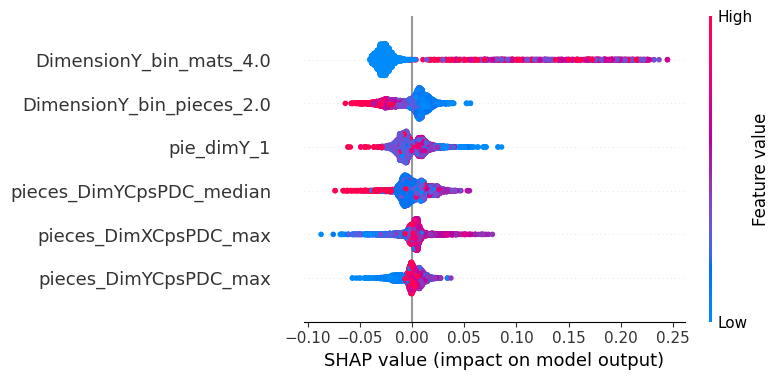

In [451]:
import shap

# Initialize the SHAP Explainer
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_train_imp)  # Assuming X_train is your training dataset

# Summarize the effects of all the features
shap.summary_plot(shap_values, X_train_imp, max_display=6)


Each SHAP value quantifies the contribution of a feature to the difference between the actual prediction and the average prediction across the dataset.

DimensionY_bin_mats_4:
High values of this feature contribute to a decrease in the predicted target value.
The consistent positioning of data points to the left indicates a regular contribution towards lower predicted values.

DimensionY_bin_pieces_2:
High values of this feature contribute to an increase in the predicted target value.
The distribution of points indicates a variable but generally positive contribution towards higher predicted values.

pie_dimY_1:
This feature has a varied contribution towards the predicted target value, with high values slightly contributing to a decrease.

pieces_DimXCpsPDC_max:
High values of this feature show a mixed contribution, with a tendency to slightly increase the predicted target value.

pieces_DimYCpsPDC_median:
This feature's high values indicate a variable contribution to the predicted target value, without a clear consistent trend.


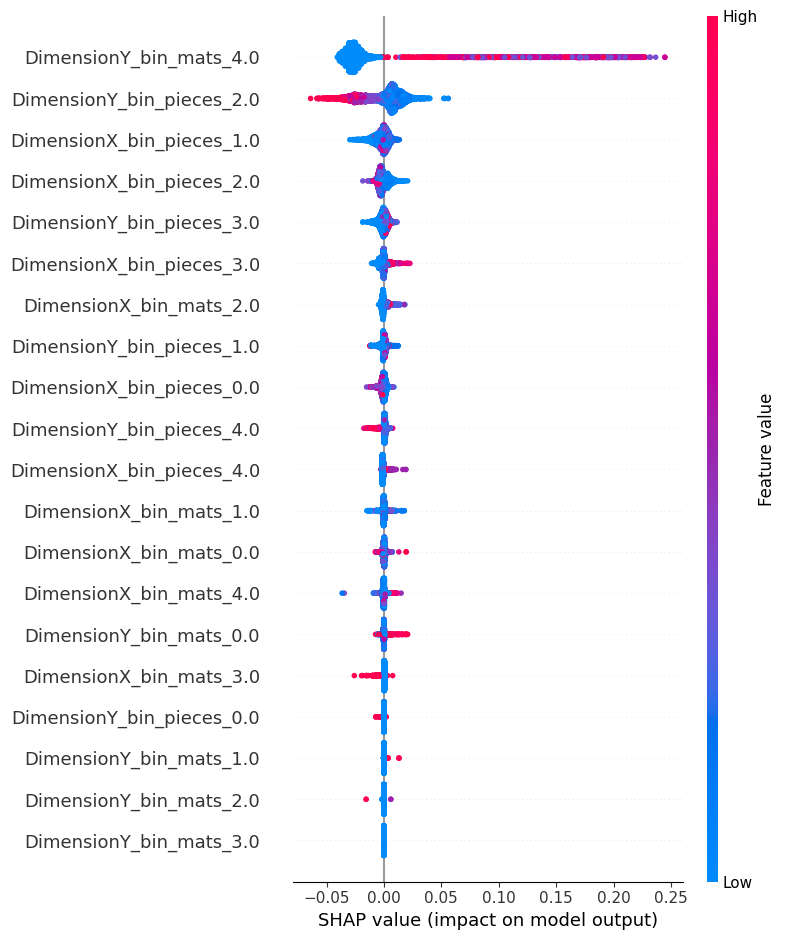

In [452]:
import shap
import pandas as pd

# Initialize the SHAP Explainer
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_train_imp)  # Assuming X_train is your training dataset

# Filter for columns that include "bin"
bin_columns = [col for col in X_train_imp.columns if "bin" in col]
X_train_bin = X_train_imp[bin_columns]

# Update shap_values for the filtered columns
shap_values_bin = shap_values[:, bin_columns]

# Summarize the effects of the filtered features
shap.summary_plot(shap_values_bin, X_train_bin, max_display=20)


### Sensitivity Analysis & Bin Columns Correlation

In [453]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
import xgboost as xgb

def plot_feature_impact(column_name,model):
    """
    Plot the impact of varying a single feature on the model's prediction.
    
    Parameters:
    column_name (str): The name of the column to vary.
    data_ns (DataFrame): The non-scaled version of the dataset.
    model (XGBRegressor or XGBClassifier): The trained XGBoost model.
    scaler (StandardScaler): The scaler used for normalization, fit on the non-scaled data.
    """
    
    # Selecting a single data point for demonstration from the non-scaled dataset
    single_data_point_ns = X_train_imp_ns.head(1).copy()
    
    scaler = StandardScaler().fit(X_train_imp_ns)
    # Absolute value adjustments to apply to the feature
    adjustments = [-3, -2, -1, 0, 1, 2, 3, 4, 5]
    results = []
    
    for adj in adjustments:
        temp_df_ns = single_data_point_ns.copy()
        # Apply the adjustment and ensure the value is not below 0 using `clip`
        temp_df_ns[column_name] = temp_df_ns[column_name].add(adj).clip(lower=0)
        # Normalize the adjusted data point
        temp_df_scaled = scaler.transform(temp_df_ns)
        # Predict with the scaled adjusted data point
        predicted_waste = model.predict(temp_df_scaled)
        results.append({'Adjustment': adj, 'PredictedWaste': predicted_waste[0]})
    
    results_df = pd.DataFrame(results)
    
    # Plotting with Plotly
    fig = go.Figure()

    # Add trace for the adjustments
    fig.add_trace(go.Scatter(x=results_df['Adjustment'],
                             y=results_df['PredictedWaste'],
                             mode='markers+lines',
                             name='Predicted Waste'))

    # Update layout
    fig.update_layout(title=f'Effect of Adjusting "{column_name}" on Predicted Waste',
                      xaxis_title='Adjustment (absolute value)',
                      yaxis_title='Predicted Waste',
                      showlegend=False)

    # Show the figure
    fig.show()

In [454]:
plot_feature_impact('DimensionY_bin_mats_4.0', xgb_model)

In [457]:
import pandas as pd
import numpy as np
import plotly.express as px

# Assuming you have the actual DataFrame 'X_train_imp_ns'
bin_columns = [col for col in X_train_imp_ns.columns if 'bin' in col]
bin_corr_matrix = X_train_imp_ns[bin_columns].corr()

# Here we use a simulated DataFrame for demonstration
#X_train_imp_ns = pd.DataFrame(np.random.rand(100, 10), columns=[f'Feature{i}' for i in range(10)])
#X_train_imp_ns.columns = ['Feature_bin_' + str(i) if i % 2 else 'Feature_' + str(i) for i in range(10)]

# Filter columns that have 'bin' in their names
bin_columns = [col for col in X_train_imp_ns.columns if 'bin' in col]
# Calculate the correlation matrix for 'bin' columns
bin_corr_matrix = X_train_imp_ns[bin_columns].corr()

# Create the heatmap using Plotly Express
fig = px.imshow(
    bin_corr_matrix,
    labels=dict(x="Features", y="Features", color="Correlation"),
    x=bin_corr_matrix.columns,
    y=bin_corr_matrix.columns,
    color_continuous_scale='RdBu_r'
)

# Update layout
fig.update_layout(title="Correlation Matrix for Materials 'bin' Columns")
fig.show()


In [458]:
def find_highest_correlated_columns(corr_matrix):
    """
    Finds the highest correlated column for each column in the DataFrame.
    Applies specific rules for 'mats' and 'pie' within column names.

    Parameters:
    corr_matrix (DataFrame): The correlation matrix.

    Returns:
    dict: A dictionary with each column and its highest correlated column based on given rules.
    """
    highest_corr_dict = {}

    for col in corr_matrix.columns:
        filtered_corr = corr_matrix[col].drop(col)  # Remove self-correlation

        # If the column name has 'mats', find the highest correlated column that includes 'pie'
        if 'X_bin_mats' in col:
            highest_corr_col = filtered_corr[filtered_corr.index.str.contains('Y_bin_mats')].idxmax()
        elif 'Y_bin_mats' in col:
            highest_corr_col = filtered_corr[filtered_corr.index.str.contains('X_bin_mats')].idxmax()
        # If the column name has 'pie', find the highest correlated column that includes 'mats'
        elif 'X_bin_pieces' in col:
            highest_corr_col = filtered_corr[filtered_corr.index.str.contains('Y_bin_pieces')].idxmax()
        elif 'Y_bin_pieces' in col:
            highest_corr_col = filtered_corr[filtered_corr.index.str.contains('X_bin_pieces')].idxmax()
        # Otherwise, just find the highest correlated column
        else:
            highest_corr_col = filtered_corr.idxmax()

        highest_corr_dict[col] = highest_corr_col

    return highest_corr_dict

# Assuming 'bin_corr_matrix' is already defined as shown in your provided code snippet.
# Use the function to find the highest correlated columns
highest_correlated_columns = find_highest_correlated_columns(bin_corr_matrix)
print(highest_correlated_columns)


{'DimensionX_bin_pieces_2.0': 'DimensionY_bin_pieces_2.0', 'DimensionY_bin_mats_2.0': 'DimensionX_bin_mats_3.0', 'DimensionY_bin_pieces_3.0': 'DimensionX_bin_pieces_2.0', 'DimensionY_bin_pieces_2.0': 'DimensionX_bin_pieces_2.0', 'DimensionX_bin_mats_4.0': 'DimensionY_bin_mats_0.0', 'DimensionX_bin_pieces_0.0': 'DimensionY_bin_pieces_2.0', 'DimensionX_bin_pieces_4.0': 'DimensionY_bin_pieces_2.0', 'DimensionX_bin_mats_3.0': 'DimensionY_bin_mats_0.0', 'DimensionY_bin_pieces_1.0': 'DimensionX_bin_pieces_0.0', 'DimensionX_bin_mats_2.0': 'DimensionY_bin_mats_0.0', 'DimensionY_bin_pieces_0.0': 'DimensionX_bin_pieces_0.0', 'DimensionX_bin_mats_0.0': 'DimensionY_bin_mats_0.0', 'DimensionY_bin_mats_3.0': 'DimensionX_bin_mats_2.0', 'DimensionX_bin_pieces_3.0': 'DimensionY_bin_pieces_2.0', 'DimensionY_bin_mats_0.0': 'DimensionX_bin_mats_1.0', 'DimensionY_bin_mats_4.0': 'DimensionX_bin_mats_0.0', 'DimensionX_bin_mats_1.0': 'DimensionY_bin_mats_0.0', 'DimensionY_bin_mats_1.0': 'DimensionX_bin_mats_0

In [663]:
pieces_dict = {}
mats_dict = {}

# Iterate over the original dictionary and separate the pairs
for key, value in highest_correlated_columns.items():
    if 'pieces' in key:
        pieces_dict[key] = value
    elif 'mats' in key:
        mats_dict[key] = value

In [664]:
def remove_duplicate_pairs(original_dict):
    # This set will keep track of seen pairs
    seen_pairs = set()
    # This dictionary will store the cleaned pairs
    cleaned_dict = {}

    for key, value in original_dict.items():
        # Sort the pair to ensure the smallest comes first (helps in identifying duplicates)
        sorted_pair = tuple(sorted([key, value]))
        
        # Check if we've already seen this pair
        if sorted_pair not in seen_pairs:
            # If not, add it to the seen pairs and to the cleaned dictionary
            seen_pairs.add(sorted_pair)
            cleaned_dict[key] = value

    return cleaned_dict

mats_cleaned_pairs = remove_duplicate_pairs(mats_dict)
pieces_cleaned_pairs = remove_duplicate_pairs(pieces_dict)
display(mats_cleaned_pairs)
display(pieces_cleaned_pairs)


{'DimensionY_bin_mats_2.0': 'DimensionX_bin_mats_3.0',
 'DimensionX_bin_mats_4.0': 'DimensionY_bin_mats_0.0',
 'DimensionX_bin_mats_3.0': 'DimensionY_bin_mats_0.0',
 'DimensionX_bin_mats_2.0': 'DimensionY_bin_mats_0.0',
 'DimensionX_bin_mats_0.0': 'DimensionY_bin_mats_0.0',
 'DimensionY_bin_mats_3.0': 'DimensionX_bin_mats_2.0',
 'DimensionY_bin_mats_0.0': 'DimensionX_bin_mats_1.0',
 'DimensionY_bin_mats_4.0': 'DimensionX_bin_mats_0.0',
 'DimensionY_bin_mats_1.0': 'DimensionX_bin_mats_0.0'}

{'DimensionX_bin_pieces_2.0': 'DimensionY_bin_pieces_2.0',
 'DimensionY_bin_pieces_3.0': 'DimensionX_bin_pieces_2.0',
 'DimensionX_bin_pieces_0.0': 'DimensionY_bin_pieces_2.0',
 'DimensionX_bin_pieces_4.0': 'DimensionY_bin_pieces_2.0',
 'DimensionY_bin_pieces_1.0': 'DimensionX_bin_pieces_0.0',
 'DimensionY_bin_pieces_0.0': 'DimensionX_bin_pieces_0.0',
 'DimensionX_bin_pieces_3.0': 'DimensionY_bin_pieces_2.0',
 'DimensionY_bin_pieces_4.0': 'DimensionX_bin_pieces_2.0',
 'DimensionX_bin_pieces_1.0': 'DimensionY_bin_pieces_2.0'}

In [546]:
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
import numpy as np

def plot_feature_impact_with_pair(column_name, model, related_columns_dict,X_test, actual_y_value):
    """
    Plot the impact of varying a single feature and its related feature on the model's prediction.
    Highlights the original (unadjusted) prediction and shows the actual y-test result.
    
    Parameters:
    column_name (str): The name of the primary column to vary.
    model (XGBRegressor or XGBClassifier): The trained XGBoost model.
    related_columns_dict (dict): A dictionary mapping columns to their related columns.
    actual_y_value (float): The actual y-test value corresponding to the data point.
    """


    single_data_point_ns = X_test.copy()
    scaler = StandardScaler().fit(X_train_imp_ns)
    related_column_name = related_columns_dict.get(column_name, None)
    adjustments = [-5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5]
    results = []
    
    for adj in adjustments:
        temp_df_ns = single_data_point_ns.copy()
        temp_df_ns[column_name] = temp_df_ns[column_name].add(adj).clip(lower=0)
        if related_column_name:
            temp_df_ns[related_column_name] = temp_df_ns[related_column_name].add(adj).clip(lower=0)
        temp_df_scaled = scaler.transform(temp_df_ns)
        predicted_waste = model.predict(temp_df_scaled)
        results.append({'Adjustment': adj, 'PredictedWaste': predicted_waste[0]})
    
    results_df = pd.DataFrame(results)
    
    fig = go.Figure()
    
    # Highlight the point where x-axis equals zero
    zero_point_y_value = results_df[results_df['Adjustment'] == 0]['PredictedWaste'].iloc[0]
    fig.add_trace(go.Scatter(x=[0], y=[zero_point_y_value],
                             mode='markers', marker=dict(color='#FF6347', size=10),
                             name='Origin'))
    
    # Add trace for the actual y-test value
    fig.add_trace(go.Scatter(x=[0], y=[actual_y_value],
                             mode='markers', marker=dict(color='LightGreen', size=10),
                             name='Actual Y-Test Value'))

    # Add trace for the adjustments
    fig.add_trace(go.Scatter(x=results_df['Adjustment'], y=results_df['PredictedWaste'],
                             mode='markers+lines', name='Predicted Waste',marker=dict(color='DeepSkyBlue'),
                         line=dict(color='LightSkyBlue')))

    title_text = f'Effect of Adjusting "{column_name}"'
    if related_column_name:
        title_text += f' and "{related_column_name}"'
    title_text += " on Predicted Waste"
    fig.update_layout(title=title_text,
                      xaxis_title='Adjustment (absolute value)',
                      yaxis_title='Predicted Waste',
                      showlegend=True)

    fig.show()


In [548]:
plot_feature_impact_with_pair("DimensionY_bin_mats_4.0", xgb_model, highest_correlated_columns,X_test_imp_ns.iloc[0:1], y_test.iloc[1] )


### Models

In [607]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, explained_variance_score, max_error


def compare_models(models, X_train, y_train, X_test, y_test):
    results = {}
    
    for model in models:
        # Train the model
        model.fit(X_train, y_train)
        
        # Predict on the test set
        y_pred = model.predict(X_test)
        
        # Calculate metrics
        r2 = r2_score(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        explained_variance = explained_variance_score(y_test, y_pred)
        max_error_val = max_error(y_test, y_pred)
        
        # Add to the results dictionary
        results[model.__class__.__name__] = {
            'R2': r2,
            'MAE': mae,
            'RMSE': rmse,
            'Max Error': max_error_val
        }
    return results

# Example usage
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

# List of model instances
models = [
    LinearRegression(),
    Ridge(),
    RandomForestRegressor(random_state=42),
    GradientBoostingRegressor(random_state=42),
    SVR(),
    KNeighborsRegressor(),
    XGBRegressor(random_state=42),]

# Compare the models
model_results = compare_models(models, X_train_imp, y_train, X_test_imp, y_test)

# Output the comparison
for model_name, metrics in model_results.items():
    print(model_name)
    for metric_name, metric_value in metrics.items():
        print(f'{metric_name}: {metric_value}')
    print()  # Newline for readability


LinearRegression
R2: 0.2754679621317355
MAE: 0.0714060703250186
RMSE: 0.09899209812758744
Max Error: 0.5782996520575256

Ridge
R2: 0.27579509027735094
MAE: 0.07141083948088524
RMSE: 0.09896974800648313
Max Error: 0.5774765285514607

DecisionTreeRegressor
R2: 0.45378032509571464
MAE: 0.04843325779858457
RMSE: 0.08595188425224572
Max Error: 0.5303414407179101

RandomForestRegressor
R2: 0.6847405967182838
MAE: 0.04312299496045481
RMSE: 0.0652988836576943
Max Error: 0.34639125056139397

GradientBoostingRegressor
R2: 0.5880294527662674
MAE: 0.05354581222017577
RMSE: 0.07464570365019939
Max Error: 0.3930439131036322

SVR
R2: 0.5177018424165086
MAE: 0.06179446931092238
RMSE: 0.08076617832721118
Max Error: 0.4507994271705432

KNeighborsRegressor
R2: 0.4158055334579379
MAE: 0.06374848030971422
RMSE: 0.08888949760469639
Max Error: 0.5950268930587161

XGBRegressor
R2: 0.6935948667125064
MAE: 0.0403677548337195
RMSE: 0.0643753718303138
Max Error: 0.33715985712865626



### HyperParameter Tuning

In [611]:
import numpy as np
import plotly.graph_objects as go
from sklearn.metrics import mean_squared_error
import xgboost as xgb

# Sample range of values for max_depth (you can change this to any hyperparameter)
max_depth_values = range(1, 15,1)  # Example range from 1 to 20
rmse_scores = []

for depth in max_depth_values:
    model = xgb.XGBRegressor(max_depth=depth, random_state=42)
    model.fit(X_train_imp, y_train)
    y_pred = model.predict(X_test_imp)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    rmse_scores.append(rmse)

# Now plot the sweep results using Plotly
fig = go.Figure(data=go.Scatter(x=list(max_depth_values), y=rmse_scores, mode='lines+markers'))

# Update the layout of the figure
fig.update_layout(
    title="RMSE vs. Max Depth for XGBRegressor",
    xaxis_title="Max Depth",
    yaxis_title="Root Mean Square Error (RMSE)",
    xaxis=dict(showgrid=True, showline=True, showticklabels=True),
    yaxis=dict(showgrid=True, showline=True, showticklabels=True),
    plot_bgcolor='white'
)

fig.show()


In [615]:
n_estimators= range(0, 200, 1)
rmse_scores = []

for depth in n_estimators:
    model = xgb.XGBRegressor(n_estimators=depth, random_state=42)
    model.fit(X_train_imp, y_train)
    y_pred = model.predict(X_test_imp)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    rmse_scores.append(rmse)

# Now plot the sweep results using Plotly
fig = go.Figure(data=go.Scatter(x=list(n_estimators), y=rmse_scores, mode='lines+markers'))

# Update the layout of the figure
fig.update_layout(
    title="RMSE vs. Estimators for XGBRegressor",
    xaxis_title="Estimators",
    yaxis_title="Root Mean Square Error (RMSE)",
    xaxis=dict(showgrid=True, showline=True, showticklabels=True),
    yaxis=dict(showgrid=True, showline=True, showticklabels=True),
    plot_bgcolor='white'
)

fig.show()

In [616]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, make_scorer, r2_score

# Define the parameter grid
params_grid = {
    'max_depth': range(3, 12, 1),
    'learning_rate': [0.01, 0.02,0.05,0.1,0.15],
    'n_estimators': range(10, 200, 10)
}

# Initialize the XGBRegressor and GridSearchCV objects
xgb = XGBRegressor(random_state=42)
grid_search = GridSearchCV(estimator=xgb, param_grid=params_grid, scoring='neg_root_mean_squared_error',
                            cv=3, n_jobs=-1,verbose=1)

# Define a custom scorer for R^2, so that we can use it later
r2_scorer = make_scorer(r2_score, greater_is_better=True)

# Fit GridSearchCV to the data
grid_search.fit(X_train_imp, y_train)

# Print the best parameters and the corresponding RMSE
best_params = grid_search.best_params_
best_rmse = np.sqrt(-grid_search.best_score_)

print("Best parameters found: ", best_params)
print("Best RMSE: ", best_rmse)

# Now calculate R^2 for the best model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_imp)
best_r2 = r2_score(y_test, y_pred)

print("Best R^2: ", best_r2)


Fitting 3 folds for each of 855 candidates, totalling 2565 fits
Best parameters found:  {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 190}
Best RMSE:  0.26681384160589133
Best R^2:  0.6980702836036528


In [620]:
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_imp)
best_r2 = r2_score(y_test, y_pred)
print("Best R^2: ", best_r2)
plot_pred(y_test,y_pred,best_model,best_r2,best_rmse)

Best R^2:  0.6980702836036528


### Final Results

In [647]:
from sklearn.metrics import mean_absolute_error

# Calculate the absolute errors between the predicted and actual values
errors = np.abs(y_pred - y_test)

# Find the indexes where the absolute error is less than 0.001
indexes = np.where(errors < 0.0001)[0]
print(indexes)

[167 212 215 444 479 952]


In [665]:
indexes = [167,444,952]
for column in mats_cleaned_pairs.keys():
    for idx in indexes:
        plot_feature_impact_with_pair(column, best_model, highest_correlated_columns,X_test_imp_ns.iloc[idx:idx+1], y_test.iloc[idx] )

In [666]:
for column in pieces_cleaned_pairs.keys():
    for idx in indexes:
        plot_feature_impact_with_pair(column, best_model, highest_correlated_columns,X_test_imp_ns.iloc[idx:idx+1], y_test.iloc[idx] )